In [1]:
import matplotlib.pyplot as plt # plotting library
import numpy as np 
import pandas as pd 
import random 
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

In [2]:
data_dir = 'dataset'

train_dataset = torchvision.datasets.MNIST(data_dir, train=True, download=True)
test_dataset  = torchvision.datasets.MNIST(data_dir, train=False, download=True)

train_transform = transforms.Compose([transforms.ToTensor(),])
test_transform = transforms.Compose([transforms.ToTensor(),])

train_dataset.transform = train_transform
test_dataset.transform = test_transform

m=len(train_dataset)


In [3]:
train_data, val_data = random_split(train_dataset, [int(m-m*0.2), int(m*0.2)])
batch_size=256

train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(val_data, batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size,shuffle=True)

In [4]:
#VariationalAutoencoder class, which combines the Encoder and Decoder classes 
class VariationalEncoder(nn.Module): # The encoder returns mean and variance matrices and we use them to obtain the sampled latent vector.
    def __init__(self, latent_dims):  
        super(VariationalEncoder, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 3, stride=2, padding=1)
        self.conv2 = nn.Conv2d(8, 16, 3, stride=2, padding=1)
        self.batch2 = nn.BatchNorm2d(16)
        self.conv3 = nn.Conv2d(16, 32, 3, stride=2, padding=0)  
        self.linear1 = nn.Linear(3*3*32, 128)
        self.linear2 = nn.Linear(128, latent_dims)
        self.linear3 = nn.Linear(128, latent_dims)

        self.N = torch.distributions.Normal(0, 1)
        self.N.loc = self.N.loc # hack to get sampling on the GPU
        self.N.scale = self.N.scale
        self.kl = 0

    def forward(self, x):
        x = x.to(device)
        x = F.relu(self.conv1(x))
        x = F.relu(self.batch2(self.conv2(x)))
        x = F.relu(self.conv3(x))
        x = torch.flatten(x, start_dim=1)
        x = F.relu(self.linear1(x))
        mu =  self.linear2(x)
        sigma = torch.exp(self.linear3(x))
        z = mu + sigma*self.N.sample(mu.shape)
        self.kl = (sigma**2 + mu**2 - torch.log(sigma) - 1/2).sum()
        return z  

In [5]:
class Decoder(nn.Module):
    
    def __init__(self, latent_dims):
        super().__init__()
        self.decoder_lin = nn.Sequential( nn.Linear(latent_dims, 128), nn.ReLU(True), nn.Linear(128, 3 * 3 * 32), nn.ReLU(True) )
        self.unflatten = nn.Unflatten(dim=1, unflattened_size=(32, 3, 3))

        self.decoder_conv = nn.Sequential(
            nn.ConvTranspose2d(32, 16, 3, stride=2, output_padding=0),
            nn.BatchNorm2d(16),
            nn.ReLU(True),
            nn.ConvTranspose2d(16, 8, 3, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(8),
            nn.ReLU(True),
            nn.ConvTranspose2d(8, 1, 3, stride=2, padding=1, output_padding=1)
        )
        
    def forward(self, x):
        x = self.decoder_lin(x)
        x = self.unflatten(x)
        x = self.decoder_conv(x)
        x = torch.sigmoid(x)
        return x

In [6]:
class VariationalAutoencoder(nn.Module): # class that merges the encoder and decoder
    def __init__(self, latent_dims):
        super(VariationalAutoencoder, self).__init__()
        self.encoder = VariationalEncoder(latent_dims)
        self.decoder = Decoder(latent_dims)

    def forward(self, x):
        x = x.to(device)
        z = self.encoder(x)
        return self.decoder(z)

In [7]:
### Set the random seed for reproducible results
torch.manual_seed(0) # Initializing the VariationalAutoencoder class
d = 4
vae = VariationalAutoencoder(latent_dims=d)
lr = 1e-3 
optim = torch.optim.Adam(vae.parameters(), lr=lr, weight_decay=1e-5)
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')
vae.to(device)

Selected device: cpu


VariationalAutoencoder(
  (encoder): VariationalEncoder(
    (conv1): Conv2d(1, 8, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (conv2): Conv2d(8, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (batch2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (conv3): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2))
    (linear1): Linear(in_features=288, out_features=128, bias=True)
    (linear2): Linear(in_features=128, out_features=4, bias=True)
    (linear3): Linear(in_features=128, out_features=4, bias=True)
  )
  (decoder): Decoder(
    (decoder_lin): Sequential(
      (0): Linear(in_features=4, out_features=128, bias=True)
      (1): ReLU(inplace=True)
      (2): Linear(in_features=128, out_features=288, bias=True)
      (3): ReLU(inplace=True)
    )
    (unflatten): Unflatten(dim=1, unflattened_size=(32, 3, 3))
    (decoder_conv): Sequential(
      (0): ConvTranspose2d(32, 16, kernel_size=(3, 3), stride=(2, 2))
      (1): BatchN

In [8]:
### Training function
def train_epoch(vae, device, dataloader, optimizer): # functions to train and evaluate the Variational Autoencoder
    vae.train()# Set train mode for both the encoder and the decoder
    train_loss = 0.0
    
    for x, _ in dataloader: # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
        x = x.to(device)# Move tensor to the proper device
        x_hat = vae(x)
        loss = ((x - x_hat)**2).sum() + vae.encoder.kl# Evaluate loss
        optimizer.zero_grad()# Backward pass
        loss.backward()
        optimizer.step()
        print('\t partial train loss (single batch): %f' % (loss.item()))# Print batch loss
        train_loss+=loss.item()

    return train_loss / len(dataloader.dataset)

In [9]:
### Testing function
def test_epoch(vae, device, dataloader):
    
    vae.eval()# Set evaluation mode for encoder and decoder
    val_loss = 0.0
    with torch.no_grad(): # No need to track the gradients
        for x, _ in dataloader:
            x = x.to(device)# Move tensor to the proper device
            encoded_data = vae.encoder(x)# Encode data
            x_hat = vae(x)# Decode data
            loss = ((x - x_hat)**2).sum() + vae.encoder.kl
            val_loss += loss.item()

    return val_loss / len(dataloader.dataset)

In [10]:
def plot_ae_outputs(encoder,decoder,n=10):
    plt.figure(figsize=(16,4.5))
    targets = test_dataset.targets.numpy()
    t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(n):
      ax = plt.subplot(2,n,i+1)
      img = test_dataset[t_idx[i]][0].unsqueeze(0).to(device)
      encoder.eval()
      decoder.eval()
      with torch.no_grad():
         rec_img  = decoder(encoder(img))
      plt.imshow(img.cpu().squeeze().numpy(), cmap='gist_gray')
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      plt.imshow(rec_img.cpu().squeeze().numpy(), cmap='gist_gray')  
      ax.get_xaxis().set_visible(False)
      ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

	 partial train loss (single batch): 8298.118164
	 partial train loss (single batch): 8069.672852
	 partial train loss (single batch): 8230.508789
	 partial train loss (single batch): 8162.578125
	 partial train loss (single batch): 8398.572266
	 partial train loss (single batch): 8227.369141
	 partial train loss (single batch): 8073.402344
	 partial train loss (single batch): 8208.064453
	 partial train loss (single batch): 8223.221680
	 partial train loss (single batch): 8028.369141
	 partial train loss (single batch): 8345.691406
	 partial train loss (single batch): 7986.712891
	 partial train loss (single batch): 7988.945312
	 partial train loss (single batch): 8017.136230
	 partial train loss (single batch): 8067.845703
	 partial train loss (single batch): 7999.001465
	 partial train loss (single batch): 8100.224609
	 partial train loss (single batch): 8255.840820
	 partial train loss (single batch): 7885.461426
	 partial train loss (single batch): 7984.327637
	 partial train loss

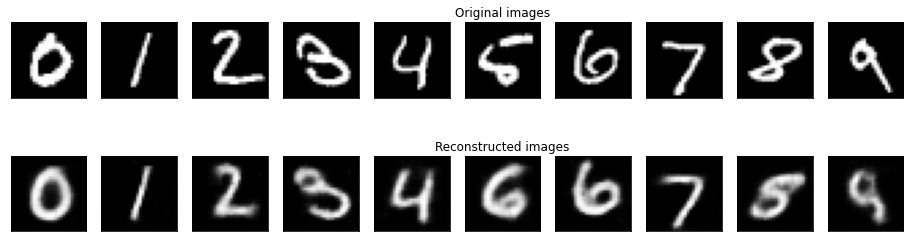

	 partial train loss (single batch): 8342.093750
	 partial train loss (single batch): 8050.519531
	 partial train loss (single batch): 8224.779297
	 partial train loss (single batch): 8122.919922
	 partial train loss (single batch): 8456.311523
	 partial train loss (single batch): 8152.469727
	 partial train loss (single batch): 8092.153809
	 partial train loss (single batch): 8139.167480
	 partial train loss (single batch): 8245.816406
	 partial train loss (single batch): 8169.723145
	 partial train loss (single batch): 8407.389648
	 partial train loss (single batch): 8073.616699
	 partial train loss (single batch): 7947.898926
	 partial train loss (single batch): 8058.805176
	 partial train loss (single batch): 8084.238770
	 partial train loss (single batch): 8085.227051
	 partial train loss (single batch): 8148.940918
	 partial train loss (single batch): 8261.353516
	 partial train loss (single batch): 7879.001465
	 partial train loss (single batch): 8010.657715
	 partial train loss

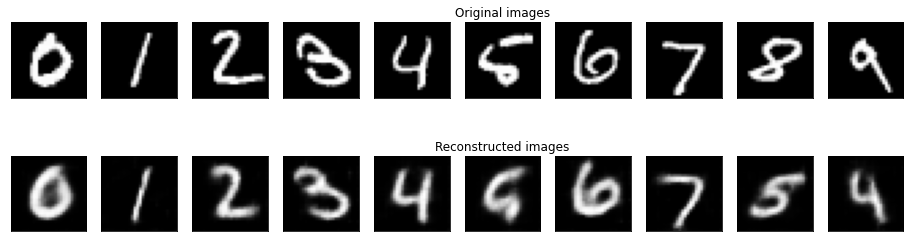

	 partial train loss (single batch): 8362.832031
	 partial train loss (single batch): 8044.041016
	 partial train loss (single batch): 8172.041992
	 partial train loss (single batch): 8093.994629
	 partial train loss (single batch): 8369.648438
	 partial train loss (single batch): 8197.520508
	 partial train loss (single batch): 8088.779297
	 partial train loss (single batch): 8164.043945
	 partial train loss (single batch): 8223.583984
	 partial train loss (single batch): 8058.832031
	 partial train loss (single batch): 8321.048828
	 partial train loss (single batch): 8087.870117
	 partial train loss (single batch): 8044.134277
	 partial train loss (single batch): 8037.729492
	 partial train loss (single batch): 8019.839844
	 partial train loss (single batch): 8031.065430
	 partial train loss (single batch): 8151.181641
	 partial train loss (single batch): 8283.914062
	 partial train loss (single batch): 7859.818359
	 partial train loss (single batch): 7996.911621
	 partial train loss

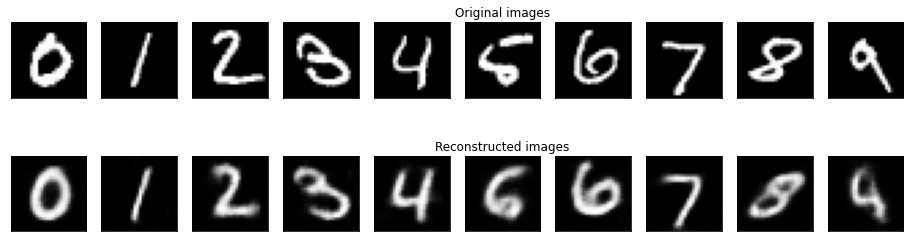

	 partial train loss (single batch): 8283.179688
	 partial train loss (single batch): 8036.159668
	 partial train loss (single batch): 8239.574219
	 partial train loss (single batch): 8074.864746
	 partial train loss (single batch): 8323.880859
	 partial train loss (single batch): 8189.906250
	 partial train loss (single batch): 7986.659180
	 partial train loss (single batch): 8135.423828
	 partial train loss (single batch): 8157.211914
	 partial train loss (single batch): 8110.576172
	 partial train loss (single batch): 8378.222656
	 partial train loss (single batch): 8088.086426
	 partial train loss (single batch): 8021.183594
	 partial train loss (single batch): 8043.746094
	 partial train loss (single batch): 8076.515137
	 partial train loss (single batch): 8013.440430
	 partial train loss (single batch): 8143.912598
	 partial train loss (single batch): 8270.105469
	 partial train loss (single batch): 7868.915039
	 partial train loss (single batch): 7970.050781
	 partial train loss

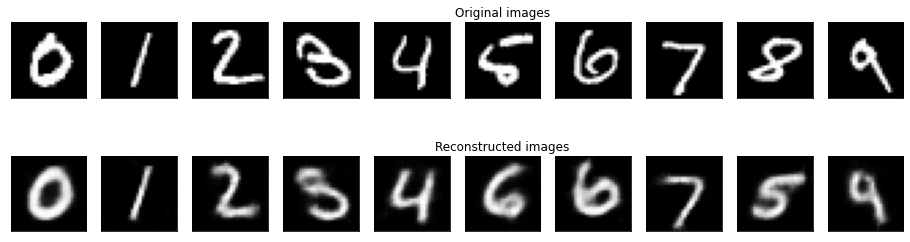

	 partial train loss (single batch): 8329.980469
	 partial train loss (single batch): 8044.507812
	 partial train loss (single batch): 8337.547852
	 partial train loss (single batch): 8118.220703
	 partial train loss (single batch): 8363.151367
	 partial train loss (single batch): 8189.691406
	 partial train loss (single batch): 8060.943359
	 partial train loss (single batch): 8109.522461
	 partial train loss (single batch): 8230.070312
	 partial train loss (single batch): 8078.755859
	 partial train loss (single batch): 8318.974609
	 partial train loss (single batch): 8042.658203
	 partial train loss (single batch): 7921.375000
	 partial train loss (single batch): 8035.988281
	 partial train loss (single batch): 8007.088379
	 partial train loss (single batch): 8045.750977
	 partial train loss (single batch): 8083.543945
	 partial train loss (single batch): 8213.783203
	 partial train loss (single batch): 7854.375000
	 partial train loss (single batch): 7987.467773
	 partial train loss

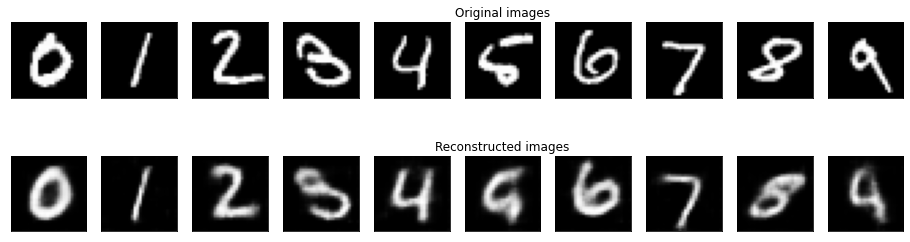

	 partial train loss (single batch): 8292.599609
	 partial train loss (single batch): 8002.477539
	 partial train loss (single batch): 8175.882812
	 partial train loss (single batch): 8089.707031
	 partial train loss (single batch): 8409.797852
	 partial train loss (single batch): 8194.175781
	 partial train loss (single batch): 7935.621582
	 partial train loss (single batch): 8108.875000
	 partial train loss (single batch): 8170.103516
	 partial train loss (single batch): 8074.859863
	 partial train loss (single batch): 8328.863281
	 partial train loss (single batch): 8023.312500
	 partial train loss (single batch): 7974.850098
	 partial train loss (single batch): 8048.196777
	 partial train loss (single batch): 8147.654785
	 partial train loss (single batch): 8017.893555
	 partial train loss (single batch): 8085.975586
	 partial train loss (single batch): 8218.377930
	 partial train loss (single batch): 7908.120117
	 partial train loss (single batch): 7935.883789
	 partial train loss

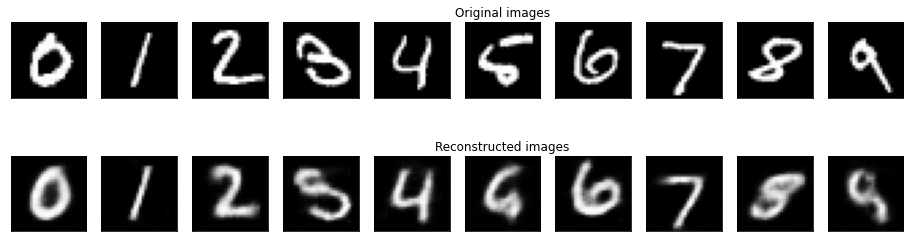

	 partial train loss (single batch): 8339.786133
	 partial train loss (single batch): 8064.906250
	 partial train loss (single batch): 8185.031250
	 partial train loss (single batch): 8033.304688
	 partial train loss (single batch): 8337.195312
	 partial train loss (single batch): 8230.625000
	 partial train loss (single batch): 8010.047852
	 partial train loss (single batch): 8098.523438
	 partial train loss (single batch): 8182.967285
	 partial train loss (single batch): 8102.064453
	 partial train loss (single batch): 8328.707031
	 partial train loss (single batch): 8055.653320
	 partial train loss (single batch): 7956.792969
	 partial train loss (single batch): 7991.679199
	 partial train loss (single batch): 8052.819824
	 partial train loss (single batch): 8003.962891
	 partial train loss (single batch): 8151.585938
	 partial train loss (single batch): 8188.172852
	 partial train loss (single batch): 7908.525391
	 partial train loss (single batch): 7977.231934
	 partial train loss

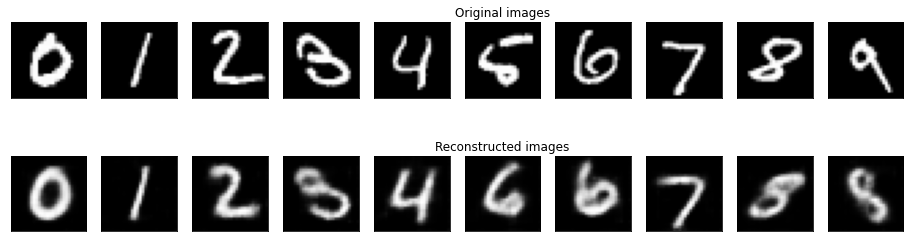

	 partial train loss (single batch): 8294.357422
	 partial train loss (single batch): 8039.162109
	 partial train loss (single batch): 8219.942383
	 partial train loss (single batch): 8103.087891
	 partial train loss (single batch): 8317.371094
	 partial train loss (single batch): 8133.495117
	 partial train loss (single batch): 7941.685547
	 partial train loss (single batch): 8126.390625
	 partial train loss (single batch): 8150.384766
	 partial train loss (single batch): 8037.490723
	 partial train loss (single batch): 8372.073242
	 partial train loss (single batch): 8042.284180
	 partial train loss (single batch): 7982.340820
	 partial train loss (single batch): 8079.307617
	 partial train loss (single batch): 8057.101074
	 partial train loss (single batch): 8047.245117
	 partial train loss (single batch): 8163.191406
	 partial train loss (single batch): 8239.785156
	 partial train loss (single batch): 7796.009277
	 partial train loss (single batch): 8041.049805
	 partial train loss

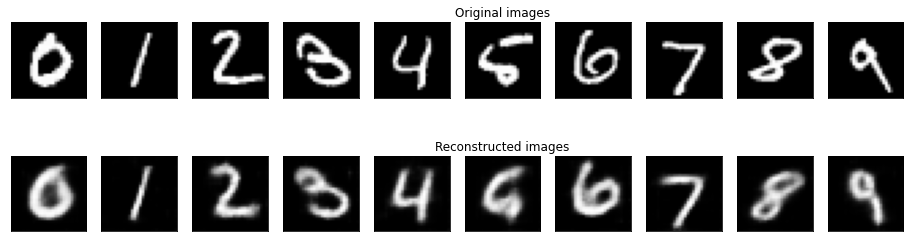

	 partial train loss (single batch): 8279.361328
	 partial train loss (single batch): 7979.448242
	 partial train loss (single batch): 8211.975586
	 partial train loss (single batch): 8098.766602
	 partial train loss (single batch): 8418.944336
	 partial train loss (single batch): 8236.575195
	 partial train loss (single batch): 8027.278320
	 partial train loss (single batch): 8042.142090
	 partial train loss (single batch): 8172.511230
	 partial train loss (single batch): 8053.779297
	 partial train loss (single batch): 8320.154297
	 partial train loss (single batch): 7951.586914
	 partial train loss (single batch): 7947.612305
	 partial train loss (single batch): 8038.623535
	 partial train loss (single batch): 8051.487305
	 partial train loss (single batch): 8043.000977
	 partial train loss (single batch): 8158.972656
	 partial train loss (single batch): 8274.947266
	 partial train loss (single batch): 7860.102539
	 partial train loss (single batch): 7965.775391
	 partial train loss

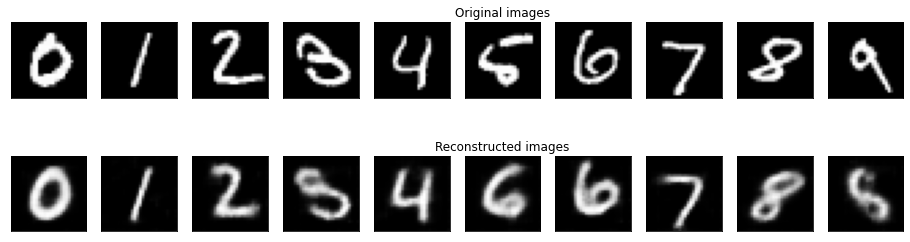

	 partial train loss (single batch): 8288.243164
	 partial train loss (single batch): 7970.376953
	 partial train loss (single batch): 8197.421875
	 partial train loss (single batch): 8091.341309
	 partial train loss (single batch): 8359.203125
	 partial train loss (single batch): 8180.441895
	 partial train loss (single batch): 8016.398438
	 partial train loss (single batch): 8155.098145
	 partial train loss (single batch): 8123.534180
	 partial train loss (single batch): 8068.279297
	 partial train loss (single batch): 8321.422852
	 partial train loss (single batch): 7997.474609
	 partial train loss (single batch): 8000.987305
	 partial train loss (single batch): 8069.862305
	 partial train loss (single batch): 8079.650391
	 partial train loss (single batch): 8000.469727
	 partial train loss (single batch): 8152.763672
	 partial train loss (single batch): 8249.776367
	 partial train loss (single batch): 7835.760742
	 partial train loss (single batch): 7926.740234
	 partial train loss

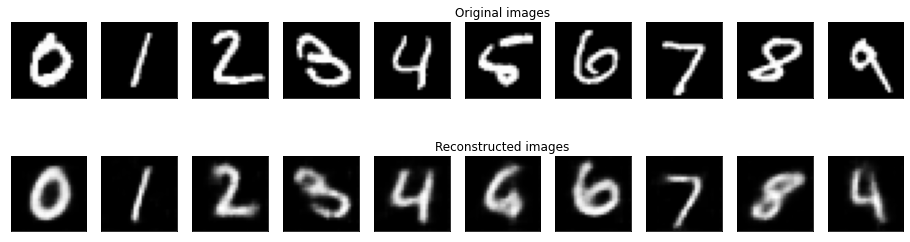

	 partial train loss (single batch): 8305.793945
	 partial train loss (single batch): 8014.812500
	 partial train loss (single batch): 8149.790039
	 partial train loss (single batch): 8125.433594
	 partial train loss (single batch): 8463.109375
	 partial train loss (single batch): 8181.339355
	 partial train loss (single batch): 7969.874023
	 partial train loss (single batch): 8136.902344
	 partial train loss (single batch): 8094.686523
	 partial train loss (single batch): 8103.409180
	 partial train loss (single batch): 8366.789062
	 partial train loss (single batch): 8069.167969
	 partial train loss (single batch): 7951.469727
	 partial train loss (single batch): 7980.043457
	 partial train loss (single batch): 8033.192383
	 partial train loss (single batch): 7962.597656
	 partial train loss (single batch): 8147.478516
	 partial train loss (single batch): 8198.262695
	 partial train loss (single batch): 7874.377930
	 partial train loss (single batch): 7886.679199
	 partial train loss

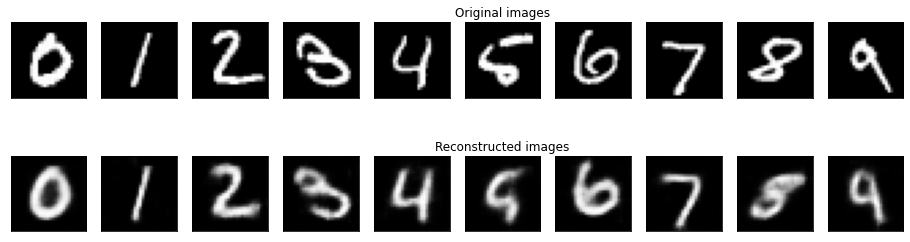

	 partial train loss (single batch): 8304.539062
	 partial train loss (single batch): 8036.498047
	 partial train loss (single batch): 8231.778320
	 partial train loss (single batch): 8117.598633
	 partial train loss (single batch): 8286.750977
	 partial train loss (single batch): 8155.548828
	 partial train loss (single batch): 7976.731445
	 partial train loss (single batch): 8097.733398
	 partial train loss (single batch): 8179.279297
	 partial train loss (single batch): 8140.428223
	 partial train loss (single batch): 8305.933594
	 partial train loss (single batch): 7988.143555
	 partial train loss (single batch): 7944.653809
	 partial train loss (single batch): 7940.366211
	 partial train loss (single batch): 8028.830078
	 partial train loss (single batch): 8071.558105
	 partial train loss (single batch): 8075.686523
	 partial train loss (single batch): 8259.163086
	 partial train loss (single batch): 7870.210938
	 partial train loss (single batch): 7877.431641
	 partial train loss

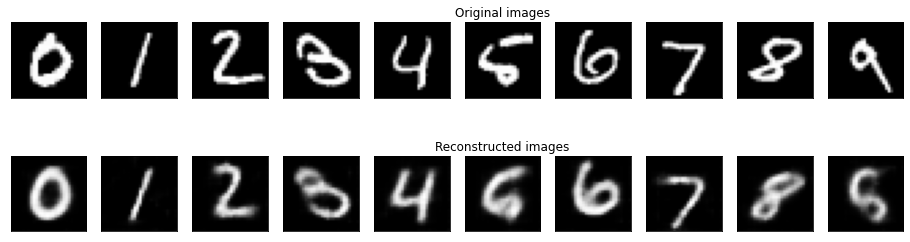

	 partial train loss (single batch): 8307.305664
	 partial train loss (single batch): 7996.387695
	 partial train loss (single batch): 8226.888672
	 partial train loss (single batch): 8091.064941
	 partial train loss (single batch): 8442.173828
	 partial train loss (single batch): 8167.376465
	 partial train loss (single batch): 8075.168457
	 partial train loss (single batch): 8093.673828
	 partial train loss (single batch): 8189.240723
	 partial train loss (single batch): 8123.792969
	 partial train loss (single batch): 8356.031250
	 partial train loss (single batch): 8031.591797
	 partial train loss (single batch): 7937.268555
	 partial train loss (single batch): 7984.060547
	 partial train loss (single batch): 7961.184082
	 partial train loss (single batch): 8000.930664
	 partial train loss (single batch): 8168.099609
	 partial train loss (single batch): 8231.260742
	 partial train loss (single batch): 7870.319336
	 partial train loss (single batch): 7935.458984
	 partial train loss

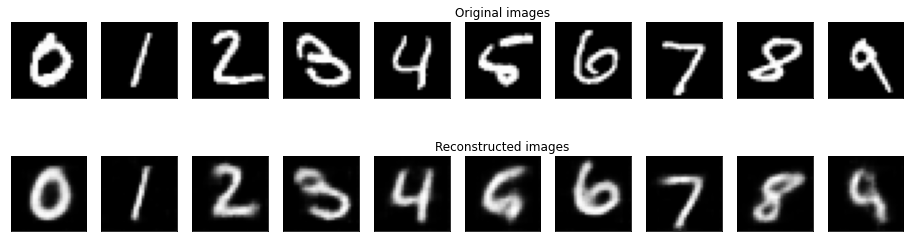

	 partial train loss (single batch): 8167.553223
	 partial train loss (single batch): 7988.821777
	 partial train loss (single batch): 8219.406250
	 partial train loss (single batch): 8055.143066
	 partial train loss (single batch): 8350.511719
	 partial train loss (single batch): 8138.221680
	 partial train loss (single batch): 7979.124023
	 partial train loss (single batch): 8136.467285
	 partial train loss (single batch): 8157.036133
	 partial train loss (single batch): 8017.651367
	 partial train loss (single batch): 8308.990234
	 partial train loss (single batch): 8124.392090
	 partial train loss (single batch): 7948.113281
	 partial train loss (single batch): 8009.600586
	 partial train loss (single batch): 8074.485352
	 partial train loss (single batch): 7978.562500
	 partial train loss (single batch): 8137.954102
	 partial train loss (single batch): 8168.620605
	 partial train loss (single batch): 7811.874512
	 partial train loss (single batch): 7882.479004
	 partial train loss

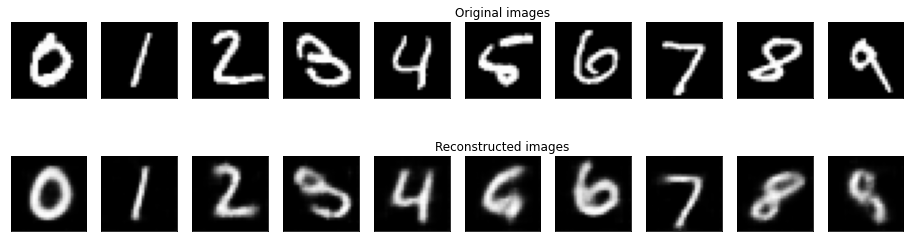

	 partial train loss (single batch): 8312.138672
	 partial train loss (single batch): 8000.324707
	 partial train loss (single batch): 8151.881348
	 partial train loss (single batch): 8047.811523
	 partial train loss (single batch): 8333.004883
	 partial train loss (single batch): 8198.230469
	 partial train loss (single batch): 7930.271973
	 partial train loss (single batch): 8057.806641
	 partial train loss (single batch): 8176.608887
	 partial train loss (single batch): 7993.438965
	 partial train loss (single batch): 8267.712891
	 partial train loss (single batch): 7989.192383
	 partial train loss (single batch): 7963.625977
	 partial train loss (single batch): 7938.979492
	 partial train loss (single batch): 7967.077148
	 partial train loss (single batch): 8003.941406
	 partial train loss (single batch): 8126.242188
	 partial train loss (single batch): 8224.747070
	 partial train loss (single batch): 7795.687500
	 partial train loss (single batch): 7854.721680
	 partial train loss

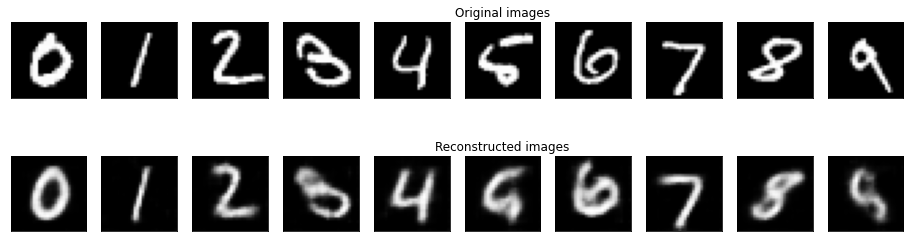

	 partial train loss (single batch): 8305.421875
	 partial train loss (single batch): 8063.794922
	 partial train loss (single batch): 8057.020508
	 partial train loss (single batch): 8171.255859
	 partial train loss (single batch): 8419.089844
	 partial train loss (single batch): 8144.777344
	 partial train loss (single batch): 8023.571289
	 partial train loss (single batch): 8084.753906
	 partial train loss (single batch): 8039.963867
	 partial train loss (single batch): 8033.878418
	 partial train loss (single batch): 8328.507812
	 partial train loss (single batch): 8028.910645
	 partial train loss (single batch): 7945.494141
	 partial train loss (single batch): 7972.215820
	 partial train loss (single batch): 8064.415039
	 partial train loss (single batch): 7990.755371
	 partial train loss (single batch): 8132.812988
	 partial train loss (single batch): 8236.048828
	 partial train loss (single batch): 7901.129883
	 partial train loss (single batch): 7942.726074
	 partial train loss

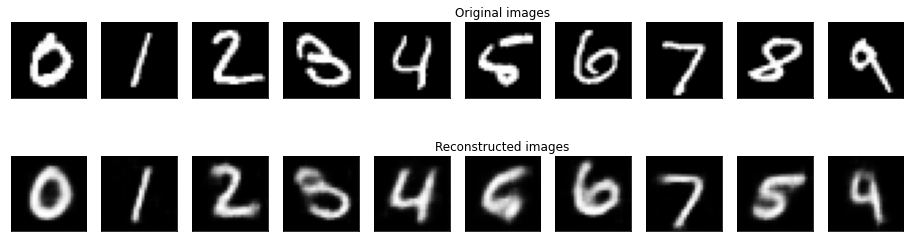

	 partial train loss (single batch): 8299.042969
	 partial train loss (single batch): 7994.124512
	 partial train loss (single batch): 8155.833008
	 partial train loss (single batch): 8029.701172
	 partial train loss (single batch): 8322.187500
	 partial train loss (single batch): 8159.966309
	 partial train loss (single batch): 7897.698242
	 partial train loss (single batch): 8109.918945
	 partial train loss (single batch): 8109.957031
	 partial train loss (single batch): 8018.004883
	 partial train loss (single batch): 8267.294922
	 partial train loss (single batch): 7975.910156
	 partial train loss (single batch): 7903.796387
	 partial train loss (single batch): 8002.560547
	 partial train loss (single batch): 7962.898438
	 partial train loss (single batch): 7982.730469
	 partial train loss (single batch): 8069.975586
	 partial train loss (single batch): 8212.058594
	 partial train loss (single batch): 7799.827637
	 partial train loss (single batch): 7941.200195
	 partial train loss

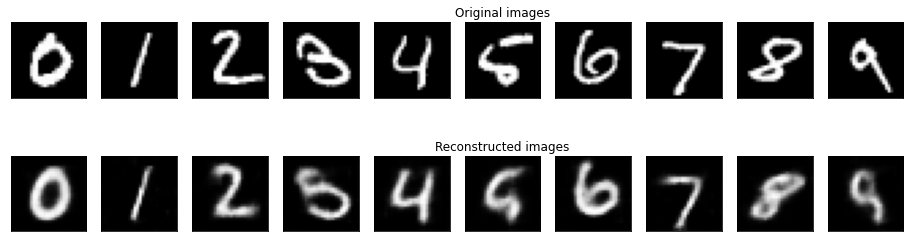

	 partial train loss (single batch): 8311.080078
	 partial train loss (single batch): 7970.407227
	 partial train loss (single batch): 8170.293945
	 partial train loss (single batch): 8055.040039
	 partial train loss (single batch): 8404.519531
	 partial train loss (single batch): 8091.655273
	 partial train loss (single batch): 7897.309082
	 partial train loss (single batch): 8120.535645
	 partial train loss (single batch): 8141.173828
	 partial train loss (single batch): 8062.012695
	 partial train loss (single batch): 8214.333008
	 partial train loss (single batch): 7982.438965
	 partial train loss (single batch): 7937.287109
	 partial train loss (single batch): 8022.088867
	 partial train loss (single batch): 8031.392090
	 partial train loss (single batch): 7973.750977
	 partial train loss (single batch): 8073.163086
	 partial train loss (single batch): 8226.440430
	 partial train loss (single batch): 7827.838867
	 partial train loss (single batch): 7929.009766
	 partial train loss

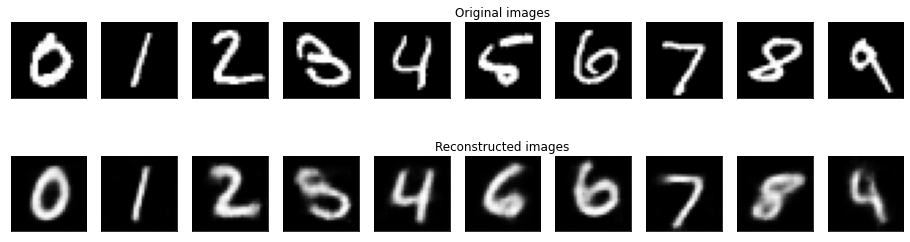

	 partial train loss (single batch): 8267.353516
	 partial train loss (single batch): 7987.777832
	 partial train loss (single batch): 8233.664062
	 partial train loss (single batch): 8043.672852
	 partial train loss (single batch): 8401.312500
	 partial train loss (single batch): 8141.959961
	 partial train loss (single batch): 7929.050293
	 partial train loss (single batch): 8051.375977
	 partial train loss (single batch): 8153.681641
	 partial train loss (single batch): 7971.992676
	 partial train loss (single batch): 8246.941406
	 partial train loss (single batch): 7895.667969
	 partial train loss (single batch): 7920.969727
	 partial train loss (single batch): 8014.971680
	 partial train loss (single batch): 7998.404297
	 partial train loss (single batch): 7997.964844
	 partial train loss (single batch): 8151.589844
	 partial train loss (single batch): 8201.611328
	 partial train loss (single batch): 7764.410156
	 partial train loss (single batch): 7876.558594
	 partial train loss

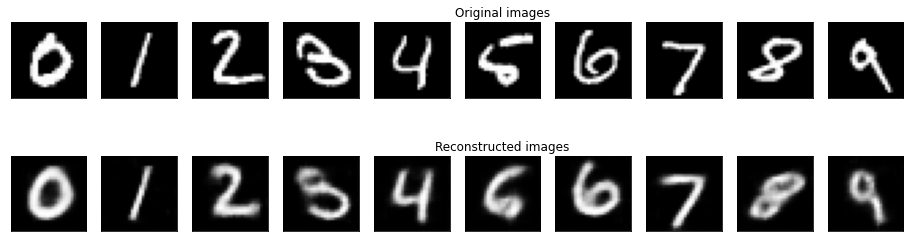

	 partial train loss (single batch): 8306.391602
	 partial train loss (single batch): 8006.482422
	 partial train loss (single batch): 8162.845215
	 partial train loss (single batch): 8060.049316
	 partial train loss (single batch): 8339.621094
	 partial train loss (single batch): 8081.708984
	 partial train loss (single batch): 7938.253906
	 partial train loss (single batch): 8059.247559
	 partial train loss (single batch): 8113.627930
	 partial train loss (single batch): 8027.923828
	 partial train loss (single batch): 8274.055664
	 partial train loss (single batch): 7923.650391
	 partial train loss (single batch): 7901.251953
	 partial train loss (single batch): 7926.297852
	 partial train loss (single batch): 7994.361816
	 partial train loss (single batch): 7938.433594
	 partial train loss (single batch): 8076.970215
	 partial train loss (single batch): 8219.566406
	 partial train loss (single batch): 7857.015625
	 partial train loss (single batch): 7941.996582
	 partial train loss

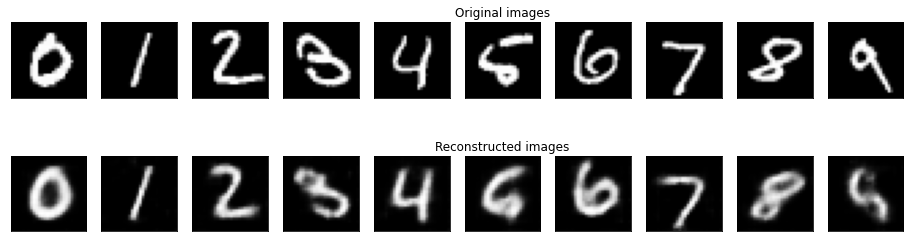

	 partial train loss (single batch): 8275.810547
	 partial train loss (single batch): 7937.058594
	 partial train loss (single batch): 8188.721680
	 partial train loss (single batch): 7990.782227
	 partial train loss (single batch): 8332.541992
	 partial train loss (single batch): 8143.844238
	 partial train loss (single batch): 8007.797363
	 partial train loss (single batch): 8058.088867
	 partial train loss (single batch): 8146.322754
	 partial train loss (single batch): 8121.886719
	 partial train loss (single batch): 8295.281250
	 partial train loss (single batch): 8001.830078
	 partial train loss (single batch): 7842.248535
	 partial train loss (single batch): 7989.267090
	 partial train loss (single batch): 8010.161621
	 partial train loss (single batch): 7933.155273
	 partial train loss (single batch): 8051.850098
	 partial train loss (single batch): 8235.400391
	 partial train loss (single batch): 7818.671387
	 partial train loss (single batch): 8006.642578
	 partial train loss

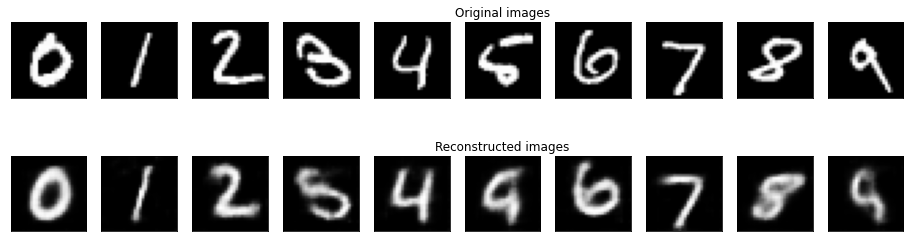

	 partial train loss (single batch): 8216.067383
	 partial train loss (single batch): 7972.838867
	 partial train loss (single batch): 8219.356445
	 partial train loss (single batch): 8031.653809
	 partial train loss (single batch): 8415.923828
	 partial train loss (single batch): 8149.150391
	 partial train loss (single batch): 7956.772461
	 partial train loss (single batch): 8084.697266
	 partial train loss (single batch): 8152.781738
	 partial train loss (single batch): 8030.802734
	 partial train loss (single batch): 8349.864258
	 partial train loss (single batch): 8013.483398
	 partial train loss (single batch): 7895.744141
	 partial train loss (single batch): 7924.486816
	 partial train loss (single batch): 8065.938477
	 partial train loss (single batch): 7920.970703
	 partial train loss (single batch): 8045.638672
	 partial train loss (single batch): 8172.651367
	 partial train loss (single batch): 7747.694336
	 partial train loss (single batch): 7914.793945
	 partial train loss

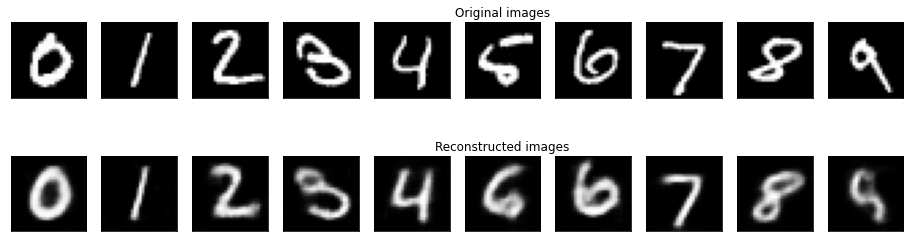

	 partial train loss (single batch): 8262.400391
	 partial train loss (single batch): 7965.646484
	 partial train loss (single batch): 8194.325195
	 partial train loss (single batch): 8112.470703
	 partial train loss (single batch): 8351.858398
	 partial train loss (single batch): 8085.526855
	 partial train loss (single batch): 7916.821289
	 partial train loss (single batch): 8051.122559
	 partial train loss (single batch): 8084.303711
	 partial train loss (single batch): 7939.958984
	 partial train loss (single batch): 8229.320312
	 partial train loss (single batch): 7992.620117
	 partial train loss (single batch): 7837.906250
	 partial train loss (single batch): 7937.079590
	 partial train loss (single batch): 7978.489258
	 partial train loss (single batch): 7903.257812
	 partial train loss (single batch): 8057.590820
	 partial train loss (single batch): 8205.443359
	 partial train loss (single batch): 7748.865723
	 partial train loss (single batch): 7832.142578
	 partial train loss

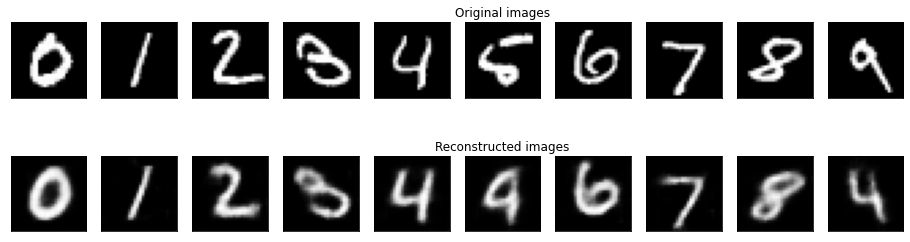

	 partial train loss (single batch): 8214.767578
	 partial train loss (single batch): 8019.154785
	 partial train loss (single batch): 8179.919922
	 partial train loss (single batch): 8065.012695
	 partial train loss (single batch): 8277.784180
	 partial train loss (single batch): 8140.850586
	 partial train loss (single batch): 7866.958496
	 partial train loss (single batch): 8080.785156
	 partial train loss (single batch): 8054.685547
	 partial train loss (single batch): 8020.537598
	 partial train loss (single batch): 8233.738281
	 partial train loss (single batch): 8057.614258
	 partial train loss (single batch): 7995.078125
	 partial train loss (single batch): 7984.526367
	 partial train loss (single batch): 7911.628418
	 partial train loss (single batch): 7922.000000
	 partial train loss (single batch): 8057.177734
	 partial train loss (single batch): 8216.483398
	 partial train loss (single batch): 7812.080566
	 partial train loss (single batch): 7876.527832
	 partial train loss

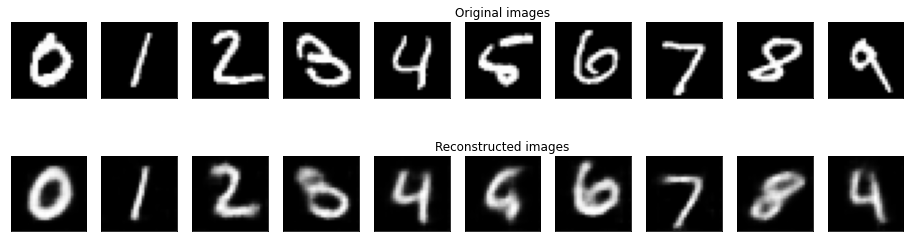

	 partial train loss (single batch): 8241.300781
	 partial train loss (single batch): 7926.137207
	 partial train loss (single batch): 8094.873047
	 partial train loss (single batch): 8027.281250
	 partial train loss (single batch): 8309.583984
	 partial train loss (single batch): 8116.826660
	 partial train loss (single batch): 7851.836914
	 partial train loss (single batch): 8060.304688
	 partial train loss (single batch): 8157.413086
	 partial train loss (single batch): 7995.708984
	 partial train loss (single batch): 8215.000000
	 partial train loss (single batch): 8013.624512
	 partial train loss (single batch): 8013.297363
	 partial train loss (single batch): 7973.814453
	 partial train loss (single batch): 7996.744629
	 partial train loss (single batch): 7974.429688
	 partial train loss (single batch): 8044.906250
	 partial train loss (single batch): 8219.706055
	 partial train loss (single batch): 7840.422852
	 partial train loss (single batch): 7921.401855
	 partial train loss

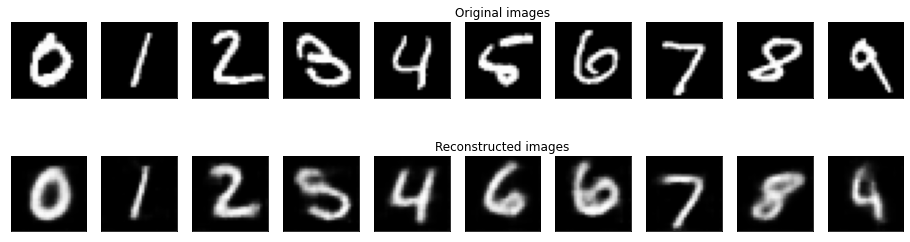

	 partial train loss (single batch): 8210.109375
	 partial train loss (single batch): 7934.033203
	 partial train loss (single batch): 8101.391113
	 partial train loss (single batch): 7986.772461
	 partial train loss (single batch): 8244.918945
	 partial train loss (single batch): 8057.074219
	 partial train loss (single batch): 7910.414062
	 partial train loss (single batch): 8165.401367
	 partial train loss (single batch): 8072.977539
	 partial train loss (single batch): 8015.001953
	 partial train loss (single batch): 8301.880859
	 partial train loss (single batch): 7979.363770
	 partial train loss (single batch): 7832.790527
	 partial train loss (single batch): 7968.385254
	 partial train loss (single batch): 7957.006836
	 partial train loss (single batch): 7909.666992
	 partial train loss (single batch): 7988.509766
	 partial train loss (single batch): 8222.400391
	 partial train loss (single batch): 7814.653809
	 partial train loss (single batch): 7948.353516
	 partial train loss

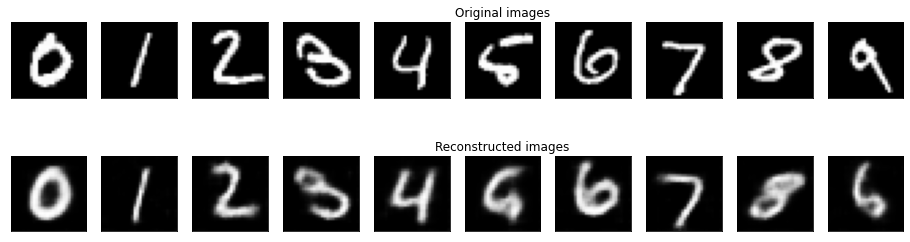

	 partial train loss (single batch): 8209.855469
	 partial train loss (single batch): 7978.537109
	 partial train loss (single batch): 8113.660156
	 partial train loss (single batch): 8005.375488
	 partial train loss (single batch): 8371.689453
	 partial train loss (single batch): 8073.212891
	 partial train loss (single batch): 7901.512695
	 partial train loss (single batch): 8000.438965
	 partial train loss (single batch): 8202.564453
	 partial train loss (single batch): 7972.773438
	 partial train loss (single batch): 8256.223633
	 partial train loss (single batch): 7942.588867
	 partial train loss (single batch): 7874.755859
	 partial train loss (single batch): 7900.068359
	 partial train loss (single batch): 7947.823242
	 partial train loss (single batch): 7967.998535
	 partial train loss (single batch): 8057.487305
	 partial train loss (single batch): 8156.947266
	 partial train loss (single batch): 7747.240234
	 partial train loss (single batch): 7883.069336
	 partial train loss

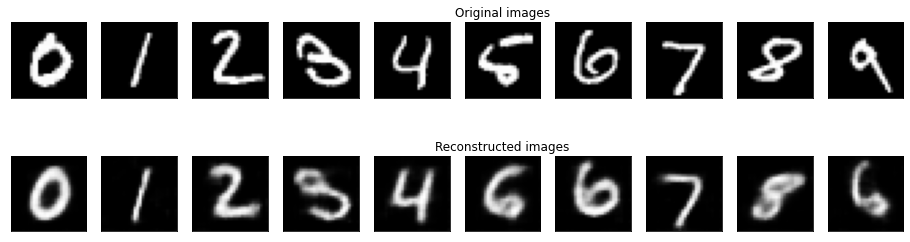

	 partial train loss (single batch): 8251.373047
	 partial train loss (single batch): 7991.628906
	 partial train loss (single batch): 8116.044434
	 partial train loss (single batch): 8057.007812
	 partial train loss (single batch): 8402.440430
	 partial train loss (single batch): 8079.806641
	 partial train loss (single batch): 8024.504395
	 partial train loss (single batch): 8087.156250
	 partial train loss (single batch): 8133.920898
	 partial train loss (single batch): 8051.935059
	 partial train loss (single batch): 8289.266602
	 partial train loss (single batch): 8034.011719
	 partial train loss (single batch): 7910.868164
	 partial train loss (single batch): 7956.127930
	 partial train loss (single batch): 7934.884766
	 partial train loss (single batch): 7915.783691
	 partial train loss (single batch): 7995.937500
	 partial train loss (single batch): 8200.849609
	 partial train loss (single batch): 7753.554688
	 partial train loss (single batch): 7847.687500
	 partial train loss

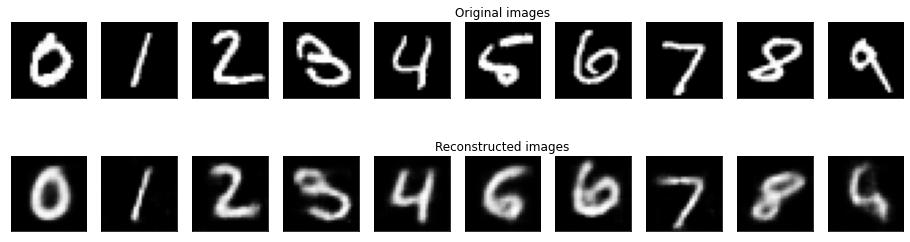

	 partial train loss (single batch): 8221.007812
	 partial train loss (single batch): 8024.644531
	 partial train loss (single batch): 8111.812500
	 partial train loss (single batch): 8017.630859
	 partial train loss (single batch): 8306.267578
	 partial train loss (single batch): 8144.962402
	 partial train loss (single batch): 8003.336914
	 partial train loss (single batch): 8054.652832
	 partial train loss (single batch): 8085.715332
	 partial train loss (single batch): 7995.143555
	 partial train loss (single batch): 8260.849609
	 partial train loss (single batch): 7956.896484
	 partial train loss (single batch): 7877.911133
	 partial train loss (single batch): 7906.875488
	 partial train loss (single batch): 7929.545898
	 partial train loss (single batch): 7954.311523
	 partial train loss (single batch): 8052.162109
	 partial train loss (single batch): 8107.133789
	 partial train loss (single batch): 7758.564941
	 partial train loss (single batch): 7894.159180
	 partial train loss

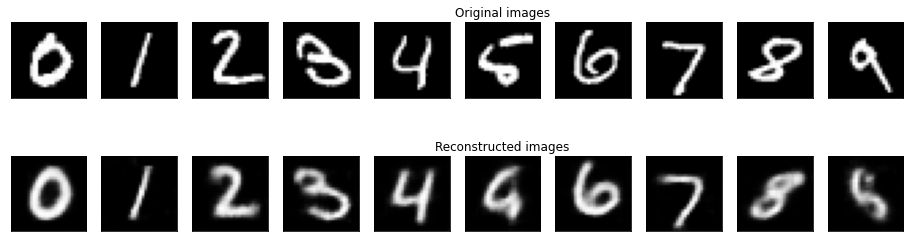

	 partial train loss (single batch): 8225.720703
	 partial train loss (single batch): 7965.615234
	 partial train loss (single batch): 8240.149414
	 partial train loss (single batch): 7983.465820
	 partial train loss (single batch): 8297.428711
	 partial train loss (single batch): 8100.803223
	 partial train loss (single batch): 7908.259277
	 partial train loss (single batch): 8016.975098
	 partial train loss (single batch): 8099.684570
	 partial train loss (single batch): 7948.623535
	 partial train loss (single batch): 8271.140625
	 partial train loss (single batch): 7995.845215
	 partial train loss (single batch): 7874.338379
	 partial train loss (single batch): 7860.648926
	 partial train loss (single batch): 7984.646484
	 partial train loss (single batch): 7912.843750
	 partial train loss (single batch): 8005.304688
	 partial train loss (single batch): 8148.347168
	 partial train loss (single batch): 7774.387695
	 partial train loss (single batch): 7822.011719
	 partial train loss

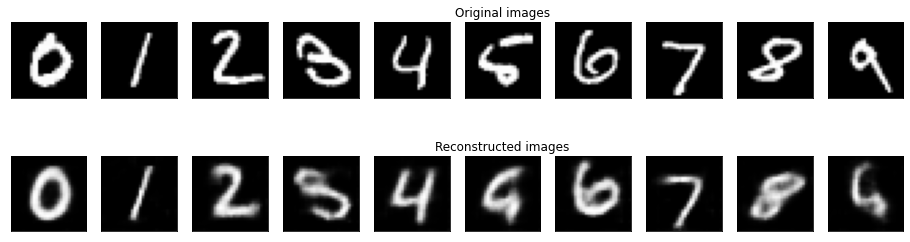

	 partial train loss (single batch): 8261.828125
	 partial train loss (single batch): 7930.470703
	 partial train loss (single batch): 8135.632812
	 partial train loss (single batch): 8057.674316
	 partial train loss (single batch): 8310.647461
	 partial train loss (single batch): 8099.180664
	 partial train loss (single batch): 7955.939453
	 partial train loss (single batch): 8057.532715
	 partial train loss (single batch): 8141.967773
	 partial train loss (single batch): 7972.772461
	 partial train loss (single batch): 8380.642578
	 partial train loss (single batch): 7993.922852
	 partial train loss (single batch): 7903.687500
	 partial train loss (single batch): 7897.432617
	 partial train loss (single batch): 8022.051270
	 partial train loss (single batch): 7946.570312
	 partial train loss (single batch): 8073.856445
	 partial train loss (single batch): 8171.205078
	 partial train loss (single batch): 7798.113770
	 partial train loss (single batch): 7875.415527
	 partial train loss

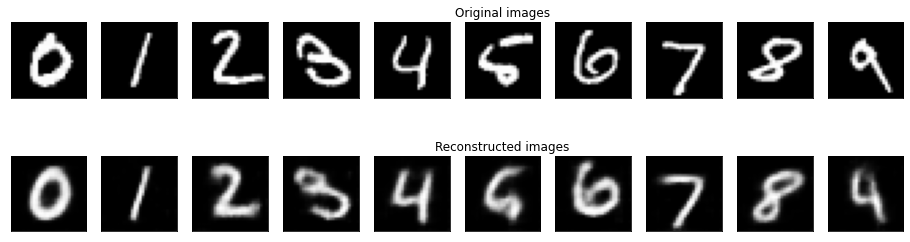

	 partial train loss (single batch): 8165.482422
	 partial train loss (single batch): 7967.685547
	 partial train loss (single batch): 8179.628906
	 partial train loss (single batch): 8085.235352
	 partial train loss (single batch): 8287.349609
	 partial train loss (single batch): 8098.893066
	 partial train loss (single batch): 7885.521973
	 partial train loss (single batch): 7965.440918
	 partial train loss (single batch): 8162.487305
	 partial train loss (single batch): 8054.043945
	 partial train loss (single batch): 8300.651367
	 partial train loss (single batch): 7902.432617
	 partial train loss (single batch): 7820.173828
	 partial train loss (single batch): 7967.452637
	 partial train loss (single batch): 7974.561523
	 partial train loss (single batch): 7944.792480
	 partial train loss (single batch): 8072.323730
	 partial train loss (single batch): 8222.806641
	 partial train loss (single batch): 7789.800293
	 partial train loss (single batch): 7809.569824
	 partial train loss

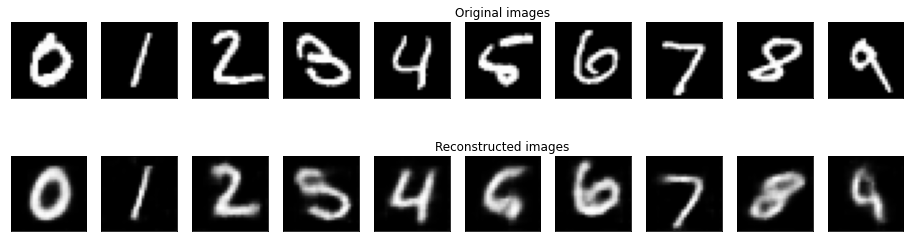

	 partial train loss (single batch): 8272.900391
	 partial train loss (single batch): 7963.787598
	 partial train loss (single batch): 8102.908203
	 partial train loss (single batch): 8027.817383
	 partial train loss (single batch): 8241.607422
	 partial train loss (single batch): 8073.674805
	 partial train loss (single batch): 7844.622070
	 partial train loss (single batch): 8060.577148
	 partial train loss (single batch): 8115.630859
	 partial train loss (single batch): 8011.958984
	 partial train loss (single batch): 8265.832031
	 partial train loss (single batch): 7991.648926
	 partial train loss (single batch): 7884.167480
	 partial train loss (single batch): 7961.738770
	 partial train loss (single batch): 7905.616699
	 partial train loss (single batch): 7894.032227
	 partial train loss (single batch): 8009.032715
	 partial train loss (single batch): 8141.076172
	 partial train loss (single batch): 7789.896973
	 partial train loss (single batch): 7894.079102
	 partial train loss

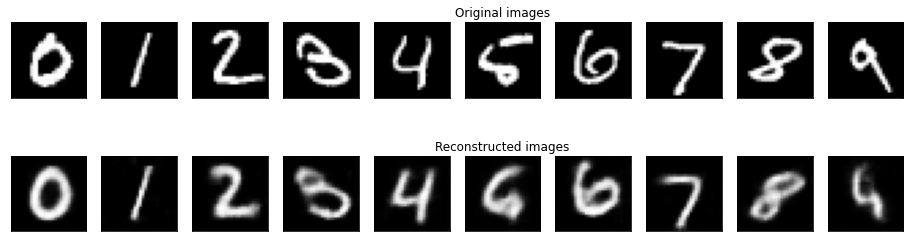

	 partial train loss (single batch): 8176.364258
	 partial train loss (single batch): 7961.339355
	 partial train loss (single batch): 8107.466797
	 partial train loss (single batch): 7936.035645
	 partial train loss (single batch): 8301.991211
	 partial train loss (single batch): 8073.138672
	 partial train loss (single batch): 7947.074707
	 partial train loss (single batch): 7960.718750
	 partial train loss (single batch): 8022.354492
	 partial train loss (single batch): 8001.693848
	 partial train loss (single batch): 8263.246094
	 partial train loss (single batch): 7905.598145
	 partial train loss (single batch): 7924.246094
	 partial train loss (single batch): 7903.619141
	 partial train loss (single batch): 7936.812500
	 partial train loss (single batch): 7896.185059
	 partial train loss (single batch): 7979.934082
	 partial train loss (single batch): 8099.218750
	 partial train loss (single batch): 7815.037598
	 partial train loss (single batch): 7802.287109
	 partial train loss

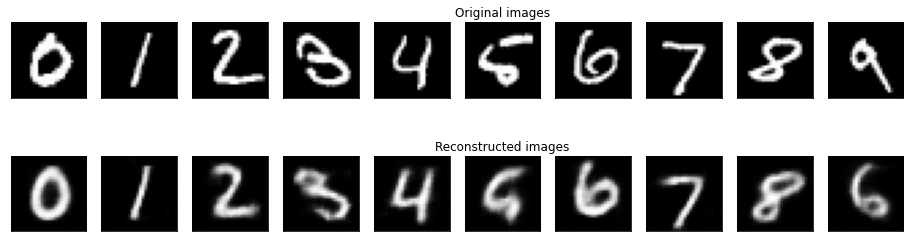

	 partial train loss (single batch): 8231.102539
	 partial train loss (single batch): 7977.049316
	 partial train loss (single batch): 8146.044922
	 partial train loss (single batch): 8026.611328
	 partial train loss (single batch): 8299.523438
	 partial train loss (single batch): 8125.570801
	 partial train loss (single batch): 7823.729004
	 partial train loss (single batch): 8025.256836
	 partial train loss (single batch): 8102.067383
	 partial train loss (single batch): 8009.066406
	 partial train loss (single batch): 8208.539062
	 partial train loss (single batch): 7929.754883
	 partial train loss (single batch): 7901.745117
	 partial train loss (single batch): 7964.050781
	 partial train loss (single batch): 7896.733398
	 partial train loss (single batch): 7960.755371
	 partial train loss (single batch): 8063.752441
	 partial train loss (single batch): 8242.202148
	 partial train loss (single batch): 7794.946777
	 partial train loss (single batch): 7841.159180
	 partial train loss

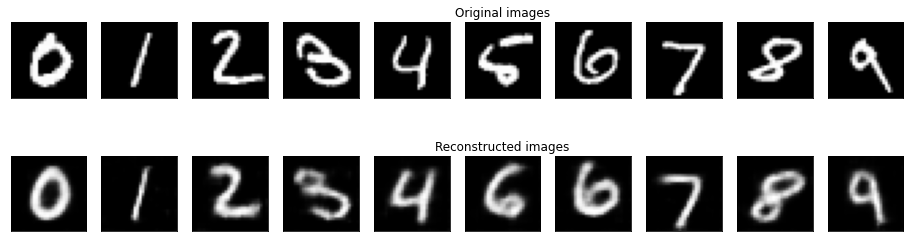

	 partial train loss (single batch): 8208.504883
	 partial train loss (single batch): 7926.838867
	 partial train loss (single batch): 8126.898438
	 partial train loss (single batch): 7997.012695
	 partial train loss (single batch): 8401.062500
	 partial train loss (single batch): 8117.499512
	 partial train loss (single batch): 7847.933594
	 partial train loss (single batch): 8116.302246
	 partial train loss (single batch): 8131.971680
	 partial train loss (single batch): 7985.502930
	 partial train loss (single batch): 8191.189453
	 partial train loss (single batch): 7899.860352
	 partial train loss (single batch): 7939.288086
	 partial train loss (single batch): 7832.672852
	 partial train loss (single batch): 7939.480469
	 partial train loss (single batch): 7840.470703
	 partial train loss (single batch): 7989.630859
	 partial train loss (single batch): 8231.951172
	 partial train loss (single batch): 7734.464355
	 partial train loss (single batch): 7830.583984
	 partial train loss

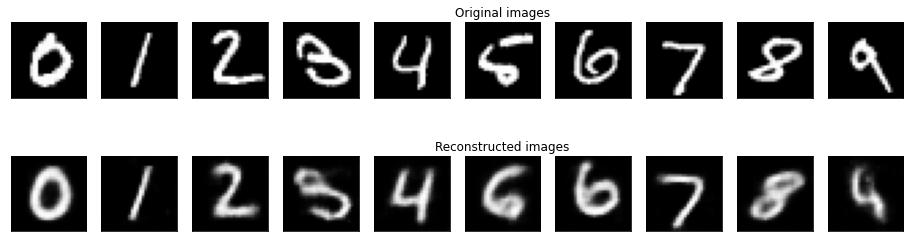

	 partial train loss (single batch): 8219.888672
	 partial train loss (single batch): 7967.750977
	 partial train loss (single batch): 8138.776855
	 partial train loss (single batch): 8009.856445
	 partial train loss (single batch): 8255.708008
	 partial train loss (single batch): 8034.185547
	 partial train loss (single batch): 7836.623047
	 partial train loss (single batch): 8083.154297
	 partial train loss (single batch): 8023.963867
	 partial train loss (single batch): 7965.652344
	 partial train loss (single batch): 8222.396484
	 partial train loss (single batch): 7910.972656
	 partial train loss (single batch): 7826.916016
	 partial train loss (single batch): 7917.065430
	 partial train loss (single batch): 7900.275391
	 partial train loss (single batch): 7899.323730
	 partial train loss (single batch): 8065.878418
	 partial train loss (single batch): 8101.038086
	 partial train loss (single batch): 7768.607422
	 partial train loss (single batch): 7889.187012
	 partial train loss

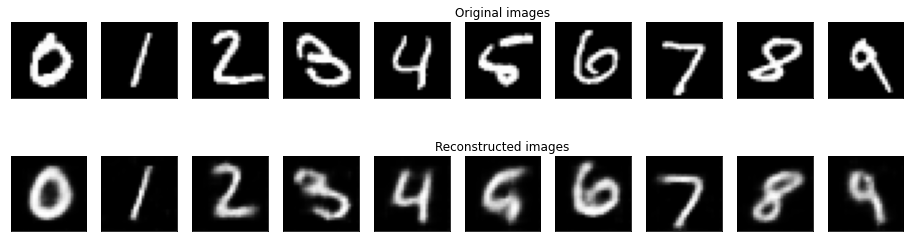

	 partial train loss (single batch): 8263.904297
	 partial train loss (single batch): 7960.602051
	 partial train loss (single batch): 8099.929688
	 partial train loss (single batch): 8030.550781
	 partial train loss (single batch): 8289.500000
	 partial train loss (single batch): 8116.695312
	 partial train loss (single batch): 7849.585938
	 partial train loss (single batch): 8056.047852
	 partial train loss (single batch): 8089.127930
	 partial train loss (single batch): 7984.141113
	 partial train loss (single batch): 8242.148438
	 partial train loss (single batch): 7974.629883
	 partial train loss (single batch): 7841.587891
	 partial train loss (single batch): 7841.480957
	 partial train loss (single batch): 7992.280273
	 partial train loss (single batch): 7941.886719
	 partial train loss (single batch): 7934.322266
	 partial train loss (single batch): 8088.399414
	 partial train loss (single batch): 7755.022461
	 partial train loss (single batch): 7859.452637
	 partial train loss

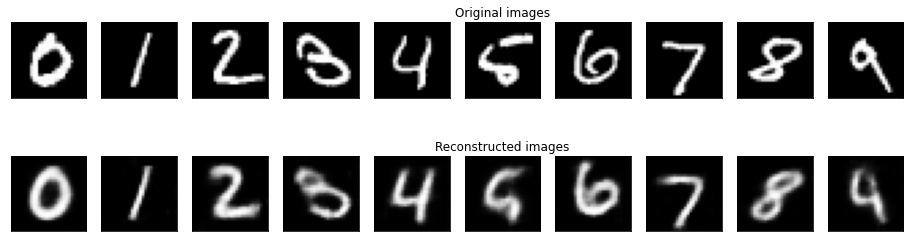

	 partial train loss (single batch): 8141.713379
	 partial train loss (single batch): 7972.816406
	 partial train loss (single batch): 8080.324219
	 partial train loss (single batch): 8007.794922
	 partial train loss (single batch): 8265.171875
	 partial train loss (single batch): 8043.820312
	 partial train loss (single batch): 7848.576172
	 partial train loss (single batch): 7968.252930
	 partial train loss (single batch): 8105.779297
	 partial train loss (single batch): 7897.245605
	 partial train loss (single batch): 8185.433594
	 partial train loss (single batch): 7923.867676
	 partial train loss (single batch): 7844.977051
	 partial train loss (single batch): 7868.559570
	 partial train loss (single batch): 7932.810547
	 partial train loss (single batch): 7877.685547
	 partial train loss (single batch): 7998.701172
	 partial train loss (single batch): 8066.546387
	 partial train loss (single batch): 7783.418945
	 partial train loss (single batch): 7889.411133
	 partial train loss

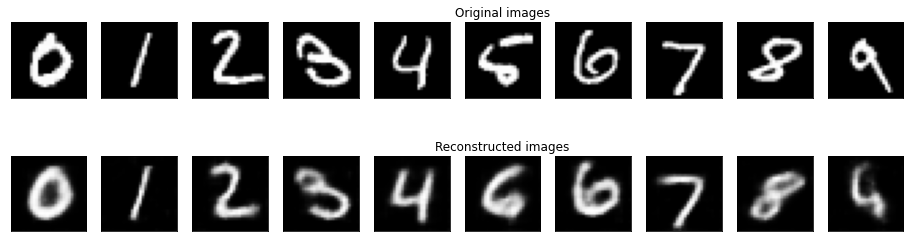

	 partial train loss (single batch): 8164.158691
	 partial train loss (single batch): 8007.952148
	 partial train loss (single batch): 8090.530273
	 partial train loss (single batch): 8091.755371
	 partial train loss (single batch): 8256.988281
	 partial train loss (single batch): 8107.825195
	 partial train loss (single batch): 7901.317871
	 partial train loss (single batch): 8095.097168
	 partial train loss (single batch): 8088.830566
	 partial train loss (single batch): 7922.375488
	 partial train loss (single batch): 8208.675781
	 partial train loss (single batch): 7975.011719
	 partial train loss (single batch): 7863.573242
	 partial train loss (single batch): 7876.380371
	 partial train loss (single batch): 7930.576660
	 partial train loss (single batch): 7888.304688
	 partial train loss (single batch): 7972.386719
	 partial train loss (single batch): 8110.510742
	 partial train loss (single batch): 7743.811523
	 partial train loss (single batch): 7855.986816
	 partial train loss

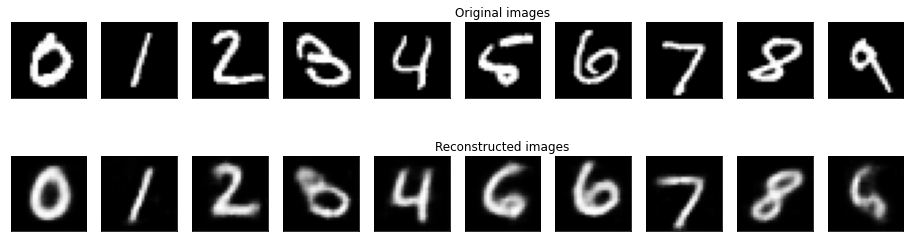

	 partial train loss (single batch): 8201.855469
	 partial train loss (single batch): 7921.094727
	 partial train loss (single batch): 8041.719727
	 partial train loss (single batch): 8025.265137
	 partial train loss (single batch): 8324.322266
	 partial train loss (single batch): 8120.955566
	 partial train loss (single batch): 7862.184570
	 partial train loss (single batch): 8018.537109
	 partial train loss (single batch): 8144.844727
	 partial train loss (single batch): 7899.832520
	 partial train loss (single batch): 8285.561523
	 partial train loss (single batch): 8033.825195
	 partial train loss (single batch): 7912.798340
	 partial train loss (single batch): 7856.488281
	 partial train loss (single batch): 7987.403320
	 partial train loss (single batch): 7818.147461
	 partial train loss (single batch): 8015.259277
	 partial train loss (single batch): 8108.465332
	 partial train loss (single batch): 7799.411133
	 partial train loss (single batch): 7862.146484
	 partial train loss

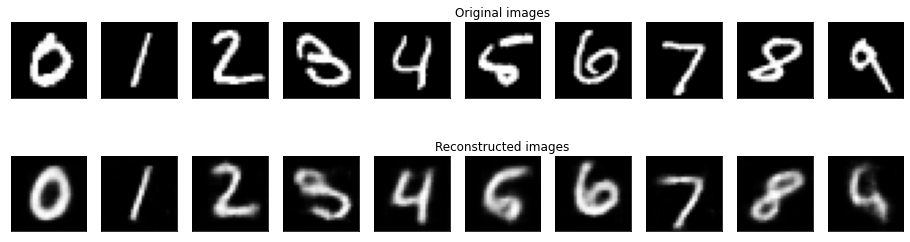

	 partial train loss (single batch): 8220.781250
	 partial train loss (single batch): 7902.489258
	 partial train loss (single batch): 8120.500977
	 partial train loss (single batch): 8029.477051
	 partial train loss (single batch): 8291.134766
	 partial train loss (single batch): 8084.625000
	 partial train loss (single batch): 7837.190918
	 partial train loss (single batch): 8046.118164
	 partial train loss (single batch): 8023.879883
	 partial train loss (single batch): 7912.122070
	 partial train loss (single batch): 8188.973633
	 partial train loss (single batch): 7910.797363
	 partial train loss (single batch): 7865.291016
	 partial train loss (single batch): 7872.146484
	 partial train loss (single batch): 7960.916016
	 partial train loss (single batch): 7889.991211
	 partial train loss (single batch): 8043.546875
	 partial train loss (single batch): 8117.802734
	 partial train loss (single batch): 7738.181152
	 partial train loss (single batch): 7778.243164
	 partial train loss

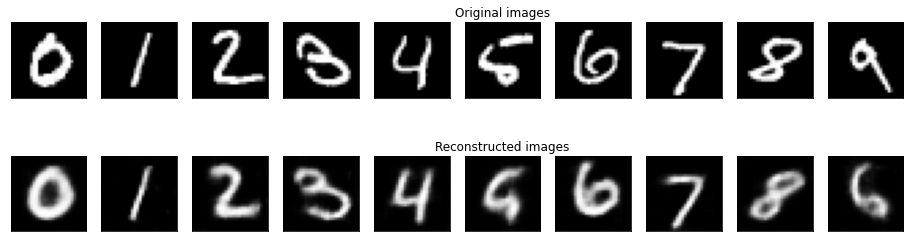

	 partial train loss (single batch): 8266.448242
	 partial train loss (single batch): 7911.566406
	 partial train loss (single batch): 8101.895508
	 partial train loss (single batch): 8052.520508
	 partial train loss (single batch): 8316.355469
	 partial train loss (single batch): 8070.672852
	 partial train loss (single batch): 7877.000000
	 partial train loss (single batch): 7920.139160
	 partial train loss (single batch): 8070.635742
	 partial train loss (single batch): 7929.253906
	 partial train loss (single batch): 8181.571289
	 partial train loss (single batch): 7946.962891
	 partial train loss (single batch): 7836.688965
	 partial train loss (single batch): 7923.227051
	 partial train loss (single batch): 7944.738281
	 partial train loss (single batch): 7895.161133
	 partial train loss (single batch): 8042.121094
	 partial train loss (single batch): 8163.078613
	 partial train loss (single batch): 7762.423828
	 partial train loss (single batch): 7907.124512
	 partial train loss

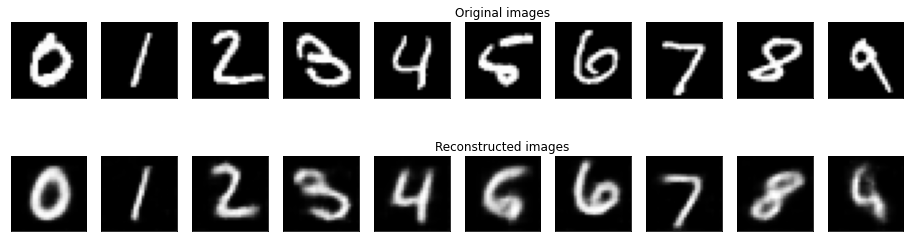

	 partial train loss (single batch): 8166.936523
	 partial train loss (single batch): 7877.783203
	 partial train loss (single batch): 8102.223633
	 partial train loss (single batch): 8026.232422
	 partial train loss (single batch): 8260.501953
	 partial train loss (single batch): 8081.015625
	 partial train loss (single batch): 7882.925781
	 partial train loss (single batch): 8077.127930
	 partial train loss (single batch): 8046.566406
	 partial train loss (single batch): 7991.005859
	 partial train loss (single batch): 8235.693359
	 partial train loss (single batch): 7957.089355
	 partial train loss (single batch): 7822.565918
	 partial train loss (single batch): 7890.452148
	 partial train loss (single batch): 7927.952148
	 partial train loss (single batch): 7793.377441
	 partial train loss (single batch): 8045.341797
	 partial train loss (single batch): 8163.638672
	 partial train loss (single batch): 7751.652344
	 partial train loss (single batch): 7818.412109
	 partial train loss

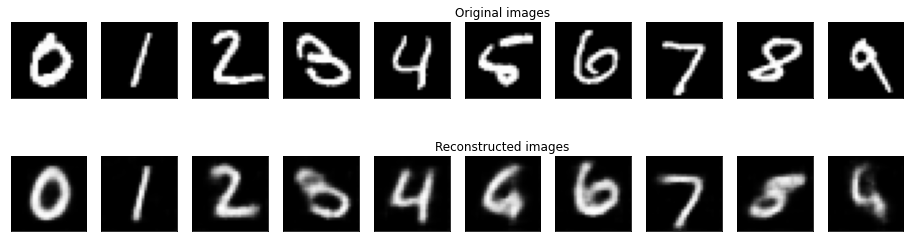

	 partial train loss (single batch): 8182.624023
	 partial train loss (single batch): 7946.788574
	 partial train loss (single batch): 7993.961426
	 partial train loss (single batch): 7952.449219
	 partial train loss (single batch): 8270.332031
	 partial train loss (single batch): 8081.304688
	 partial train loss (single batch): 7812.349609
	 partial train loss (single batch): 8021.405273
	 partial train loss (single batch): 8042.335938
	 partial train loss (single batch): 7931.997070
	 partial train loss (single batch): 8206.830078
	 partial train loss (single batch): 7879.146484
	 partial train loss (single batch): 7869.007812
	 partial train loss (single batch): 7860.195312
	 partial train loss (single batch): 7969.446289
	 partial train loss (single batch): 7801.588867
	 partial train loss (single batch): 8079.461426
	 partial train loss (single batch): 8126.384766
	 partial train loss (single batch): 7794.947266
	 partial train loss (single batch): 7839.884766
	 partial train loss

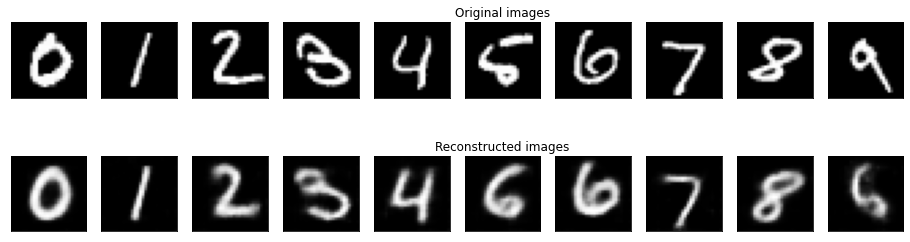

	 partial train loss (single batch): 8266.148438
	 partial train loss (single batch): 7988.815430
	 partial train loss (single batch): 8134.542969
	 partial train loss (single batch): 8045.345703
	 partial train loss (single batch): 8273.105469
	 partial train loss (single batch): 8124.692871
	 partial train loss (single batch): 7916.065918
	 partial train loss (single batch): 8045.457031
	 partial train loss (single batch): 8094.218750
	 partial train loss (single batch): 7950.507812
	 partial train loss (single batch): 8233.207031
	 partial train loss (single batch): 7905.444336
	 partial train loss (single batch): 7838.608398
	 partial train loss (single batch): 7897.685059
	 partial train loss (single batch): 7937.856445
	 partial train loss (single batch): 7838.635254
	 partial train loss (single batch): 7965.537109
	 partial train loss (single batch): 8167.733887
	 partial train loss (single batch): 7684.056152
	 partial train loss (single batch): 7946.514648
	 partial train loss

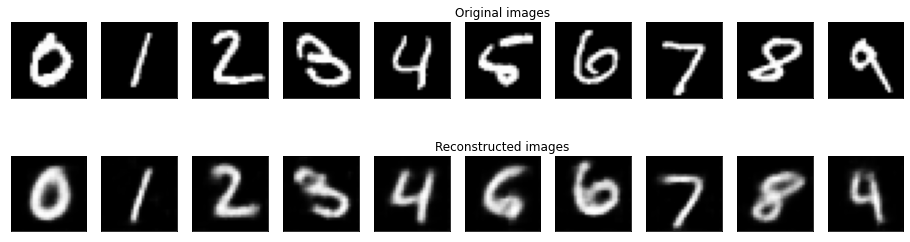

	 partial train loss (single batch): 8099.431152
	 partial train loss (single batch): 7885.397949
	 partial train loss (single batch): 8074.145508
	 partial train loss (single batch): 7933.642578
	 partial train loss (single batch): 8257.278320
	 partial train loss (single batch): 8101.005371
	 partial train loss (single batch): 7852.425781
	 partial train loss (single batch): 8012.924805
	 partial train loss (single batch): 8097.564453
	 partial train loss (single batch): 7875.343750
	 partial train loss (single batch): 8198.212891
	 partial train loss (single batch): 7996.829102
	 partial train loss (single batch): 7770.268555
	 partial train loss (single batch): 7825.124023
	 partial train loss (single batch): 7902.029785
	 partial train loss (single batch): 7857.499023
	 partial train loss (single batch): 8008.132324
	 partial train loss (single batch): 8081.154297
	 partial train loss (single batch): 7796.854492
	 partial train loss (single batch): 7837.280273
	 partial train loss

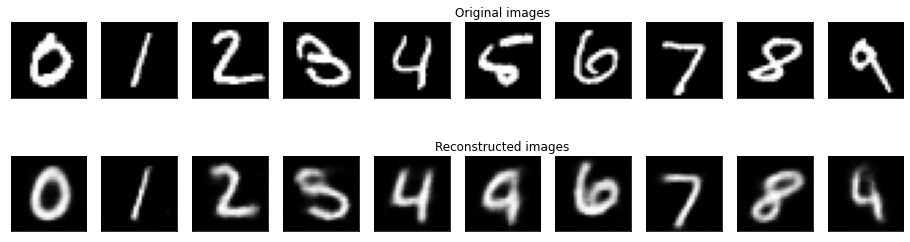

	 partial train loss (single batch): 8157.716797
	 partial train loss (single batch): 7941.523438
	 partial train loss (single batch): 8144.619141
	 partial train loss (single batch): 8012.250977
	 partial train loss (single batch): 8266.407227
	 partial train loss (single batch): 7992.503906
	 partial train loss (single batch): 7869.562500
	 partial train loss (single batch): 8057.652344
	 partial train loss (single batch): 8082.922852
	 partial train loss (single batch): 7906.904785
	 partial train loss (single batch): 8205.623047
	 partial train loss (single batch): 7845.364746
	 partial train loss (single batch): 7847.353027
	 partial train loss (single batch): 7831.178711
	 partial train loss (single batch): 7915.973633
	 partial train loss (single batch): 7936.112305
	 partial train loss (single batch): 8032.198730
	 partial train loss (single batch): 8081.383789
	 partial train loss (single batch): 7728.620117
	 partial train loss (single batch): 7836.967773
	 partial train loss

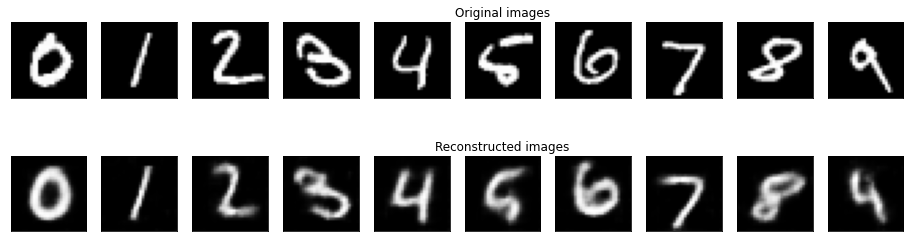

	 partial train loss (single batch): 8177.830566
	 partial train loss (single batch): 7974.987305
	 partial train loss (single batch): 8067.022949
	 partial train loss (single batch): 7917.899414
	 partial train loss (single batch): 8262.569336
	 partial train loss (single batch): 7996.288086
	 partial train loss (single batch): 7895.856445
	 partial train loss (single batch): 8021.812988
	 partial train loss (single batch): 8011.841797
	 partial train loss (single batch): 7931.357910
	 partial train loss (single batch): 8128.000488
	 partial train loss (single batch): 7794.858398
	 partial train loss (single batch): 7787.611816
	 partial train loss (single batch): 7884.454102
	 partial train loss (single batch): 7898.585449
	 partial train loss (single batch): 7918.160156
	 partial train loss (single batch): 7982.902832
	 partial train loss (single batch): 8149.178711
	 partial train loss (single batch): 7699.176758
	 partial train loss (single batch): 7883.675781
	 partial train loss

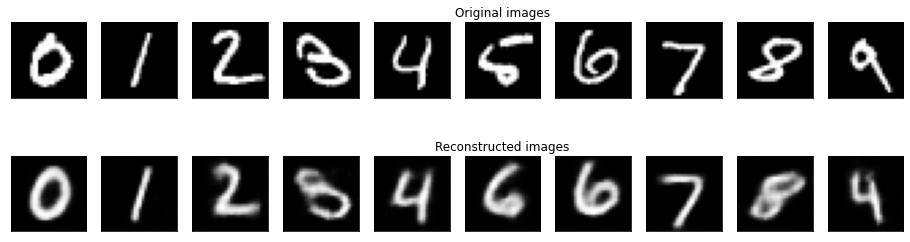

	 partial train loss (single batch): 8222.084961
	 partial train loss (single batch): 7906.617676
	 partial train loss (single batch): 8051.701172
	 partial train loss (single batch): 8010.155273
	 partial train loss (single batch): 8266.795898
	 partial train loss (single batch): 8051.845215
	 partial train loss (single batch): 7840.860352
	 partial train loss (single batch): 8005.360352
	 partial train loss (single batch): 8124.590332
	 partial train loss (single batch): 7947.875977
	 partial train loss (single batch): 8145.455566
	 partial train loss (single batch): 7936.815430
	 partial train loss (single batch): 7835.541016
	 partial train loss (single batch): 7879.061523
	 partial train loss (single batch): 7974.810547
	 partial train loss (single batch): 7880.542969
	 partial train loss (single batch): 7953.980957
	 partial train loss (single batch): 8158.056641
	 partial train loss (single batch): 7797.712891
	 partial train loss (single batch): 7834.190918
	 partial train loss

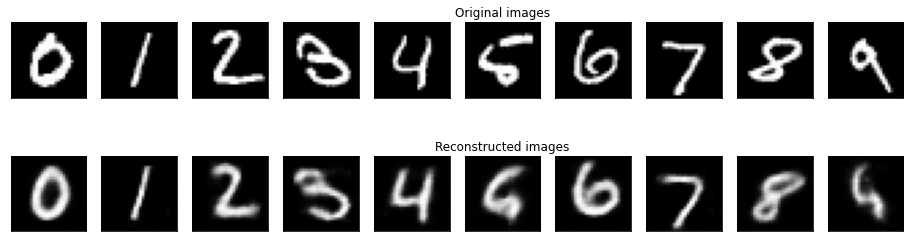

In [21]:

num_epochs = 50

for epoch in range(num_epochs): # train the VAE and evaluate in the validation set
   train_loss = train_epoch(vae,device,train_loader,optim)
   val_loss = test_epoch(vae,device,valid_loader)
   print('\n EPOCH {}/{} \t train loss {:.3f} \t val loss {:.3f}'.format(epoch + 1, num_epochs,train_loss,val_loss))
   plot_ae_outputs(vae.encoder,vae.decoder,n=10)

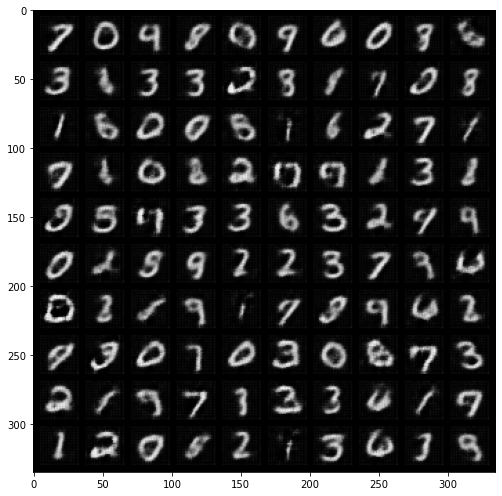

In [14]:
def show_image(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

vae.eval()
with torch.no_grad():
    latent = torch.randn(128, d, device=device)# sample latent vectors from the normal distribution
    img_recon = vae.decoder(latent)# reconstruct images from the latent vectors
    img_recon = img_recon.cpu()
    fig, ax = plt.subplots(figsize=(20, 8.5))
    show_image(torchvision.utils.make_grid(img_recon.data[:100],10,5))
    plt.show()

### Here most of the generated samples look like digits, so the Variational Autoencoder seems to have learned robust patterns from the latent space

100%|███████████████████████████████████| 10000/10000 [00:07<00:00, 1374.55it/s]


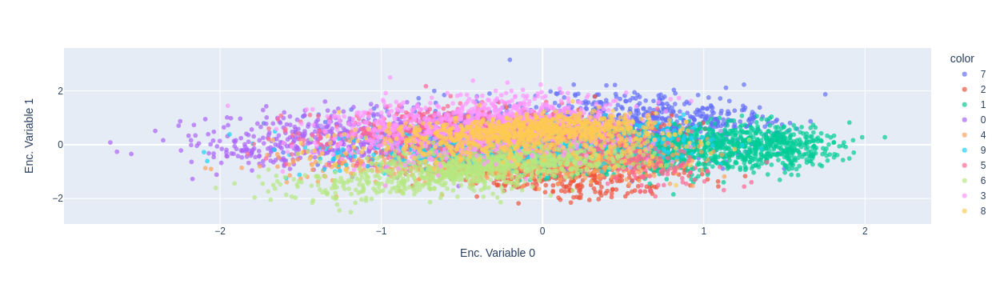

In [18]:
from tqdm import tqdm
encoded_samples = []
for sample in tqdm(test_dataset):
    img = sample[0].unsqueeze(0).to(device)
    label = sample[1]
    
    vae.eval()# Encode image
    with torch.no_grad():
        encoded_img  = vae.encoder(img)
    
    encoded_img = encoded_img.flatten().cpu().numpy()# Append to list
    encoded_sample = {f"Enc. Variable {i}": enc for i, enc in enumerate(encoded_img)}
    encoded_sample['label'] = label
    encoded_samples.append(encoded_sample)
    
encoded_samples = pd.DataFrame(encoded_samples)
encoded_samples


from sklearn.manifold import TSNE
import plotly.express as px

px.scatter(encoded_samples, x='Enc. Variable 0', y='Enc. Variable 1', color=encoded_samples.label.astype(str), opacity=0.7)

/home/msc2/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/home/msc2/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



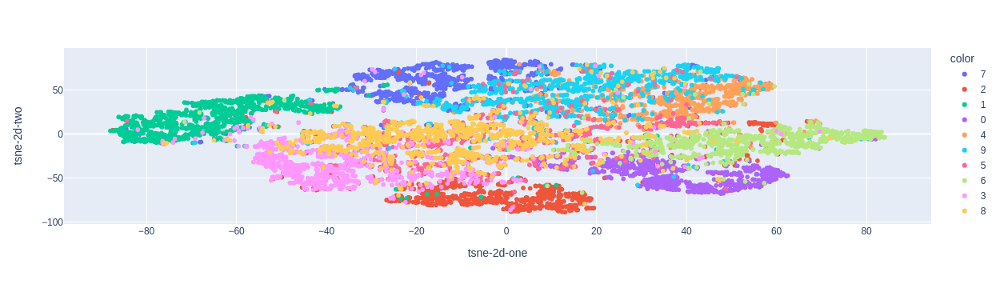

In [19]:
tsne = TSNE(n_components=2)
tsne_results = tsne.fit_transform(encoded_samples.drop(['label'],axis=1))

fig = px.scatter(tsne_results, x=0, y=1, color=encoded_samples.label.astype(str),labels={'0': 'tsne-2d-one', '1': 'tsne-2d-two'})
fig.show()